In [1]:
import numpy as np
import json
from PIL import Image
from collections import Counter
from pathlib import Path
import gc

%matplotlib inline
from matplotlib import pyplot as plt
import matplotlib.patches as patches

In [2]:
modes = [
    'no-beta',
    'spatial_adaptive',
    'attention',
    'implicit',
    'bbox',
    'spatial_adaptive-attention',
    'spatial_adaptive-bbox',
    'implicit-r',
    'bbox-r',
    'attention-r',
]

dir_path = 'visual_genome/data/relationships/'
epochs = 15
history = {
    mode: np.load(dir_path + 'caption_model_{0}_{1}epochs_history.npy'.format(mode, epochs))[None][0]
    for mode in modes
    if Path(dir_path + 'caption_model_{0}_{1}epochs_history.npy'.format(mode, epochs)).is_file()
}

In [6]:
! ls visual_genome/data/relationships/

/nix/store/56nrxy58wbhvs2sy3rir1jqa68p0kkm5-bash-4.4-p23/bin/sh: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
 caption_model1.h5
 caption_model2.h5
 caption_model2_4epocs.h5
 caption_model2_att_5epocs.h5
 caption_model_attention-r_10epochs_history.npy
 caption_model_attention-r_15epochs.h5
 caption_model_attention-r_15epochs_history.npy
 caption_model_attention-rimplicit-r_1epochs.h5
 caption_model_attention-rimplicit-r_1epochs_history.npy
 caption_model_attention_10epochs.h5
 caption_model_attention_10epochs_history.npy
 caption_model_attention_15epochs.h5
 caption_model_attention_15epochs_history.npy
 caption_model_attention_1epochs.h5
 caption_model_attention_1epochs_history.npy
 caption_model_attention_2epochs.h5
 caption_model_attention_2epochs_history.npy
 caption_model_attention_3epochs.h5
 caption_model_attention_3epochs_history.npy
 caption_model_attention_4epochs.h5
 caption_model_attention_4epochs_history.npy
 caption_model_attention_5epochs.h5
 caption_mod

In [3]:
history

{'no-beta': {'val_loss': [0.8994134101602766,
   0.896425897072232,
   0.8999730822585877,
   0.9083069197715274,
   0.9095520656260233,
   0.9153296900173974,
   0.9205305722970811,
   0.9244233053828043,
   0.9277056008104294,
   0.9314644631885347,
   0.9357161993072146,
   0.9389843098700993,
   0.9432140695670295,
   0.9438555262391529,
   0.9475851076935965],
  'loss': [0.9092610630063274,
   0.8333702084415889,
   0.8169801198166945,
   0.807513130626997,
   0.8011763907325044,
   0.796411703409382,
   0.792776806887107,
   0.7899233234550859,
   0.7875225294656694,
   0.7855811799642687,
   0.783991392798613,
   0.7826167767381369,
   0.7814110914600667,
   0.7804331040780579,
   0.7795679031881758]},
 'spatial_adaptive': {'val_loss': [0.8329082044344099,
   0.8078873163177853,
   0.8012091737891001,
   0.7976786288950178,
   0.7939962500617618,
   0.7938754567078181,
   0.7932248852555714,
   0.7923434910320101,
   0.7942064566271646,
   0.7960612575213114,
   0.79535646930573

{'no-beta': 'simple', 'spatial_adaptive': '$spatial\\ attention$', 'implicit': '$obj_1, obj_2$', 'attention': '$obj_1, obj_2, s\\ (mask)$', 'bbox': '$obj_1, obj_2,  s\\ (VisKE)$', 'implicit-r': 'r $obj_1, obj_2$', 'attention-r': 'r $obj_1, obj_2, s\\ (mask)$', 'bbox-r': 'r $obj_1, obj_2,  s\\ (VisKE)$'}
simple 0.9475851076935965
$spatial\ attention$ 0.7968434172017234
$obj_1, obj_2$ 0.6539822495172894
$obj_1, obj_2, s\ (mask)$ 0.6484514913861714
$obj_1, obj_2,  s\ (VisKE)$ 0.6455103021765513
r $obj_1, obj_2$ 0.674264810482661
r $obj_1, obj_2, s\ (mask)$ 0.6812851790397886
r $obj_1, obj_2,  s\ (VisKE)$ 0.6480004937875838


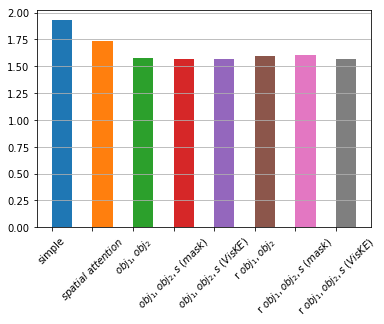

In [4]:
#mode2title = {mode: mode for mode in history}
mode2title = {}
mode2title['no-beta'] = 'simple'
mode2title['spatial_adaptive'] = '$spatial\ attention$'
mode2title['implicit'] = '$obj_1, obj_2$'
mode2title['attention'] = '$obj_1, obj_2, s\ (mask)$'
mode2title['bbox'] = '$obj_1, obj_2,  s\ (VisKE)$'
mode2title['implicit-r'] = 'r $obj_1, obj_2$'
mode2title['attention-r'] = 'r $obj_1, obj_2, s\ (mask)$'
mode2title['bbox-r'] = 'r $obj_1, obj_2,  s\ (VisKE)$'

print(mode2title)
xtitles = []
for i,mode in enumerate(mode2title):
    if mode == 'spatial_adaptive-bbox' or mode not in mode2title or mode not in history:
        continue
    
    print(mode2title[mode], history[mode]['val_loss'][epochs-1])
    xtitles.append(mode2title[mode])
    #plt.plot(range(1, epochs+1), history[mode]['val_loss'], label='{0} (val)'.format(mode2title[mode]))
    #plt.plot(range(1, epochs+1), history[mode]['loss'], label='{0}'.format(mode2title[mode]))
    plt.bar([i+0.25], [2**history[mode]['val_loss'][epochs-1]], width=0.5, label='{0} (train)'.format(mode2title[mode]))
    #plt.bar([i+0.25], history[mode]['loss'][2:], width=0.5, label='{0} (train)'.format(mode2title[mode]))
    #plt.plot(range(2, epochs+1), history[mode]['val_loss'][1:], label='{0} (val)'.format(mode))
    #plt.plot(range(2, epochs+1), history[mode]['loss'][1:], label='{0} (train)'.format(mode))

#plt.legend(loc='upper right', bbox_to_anchor=(1.5, 1),
#           #ncol=len(history),
#           fancybox=True, shadow=True)
plt.xticks(np.arange(len(xtitles)), xtitles, rotation=45)
#plt.savefig('bargraph_mrs.pdf', bbox_inches='tight')
plt.grid(axis='y')
plt.show()

In [12]:
1600*0.05

80.0

In [5]:
history

{'no-beta': {'val_loss': [0.8994134101602766,
   0.896425897072232,
   0.8999730822585877,
   0.9083069197715274,
   0.9095520656260233,
   0.9153296900173974,
   0.9205305722970811,
   0.9244233053828043,
   0.9277056008104294,
   0.9314644631885347,
   0.9357161993072146,
   0.9389843098700993,
   0.9432140695670295,
   0.9438555262391529,
   0.9475851076935965],
  'loss': [0.9092610630063274,
   0.8333702084415889,
   0.8169801198166945,
   0.807513130626997,
   0.8011763907325044,
   0.796411703409382,
   0.792776806887107,
   0.7899233234550859,
   0.7875225294656694,
   0.7855811799642687,
   0.783991392798613,
   0.7826167767381369,
   0.7814110914600667,
   0.7804331040780579,
   0.7795679031881758]},
 'spatial_adaptive': {'val_loss': [0.8329082044344099,
   0.8078873163177853,
   0.8012091737891001,
   0.7976786288950178,
   0.7939962500617618,
   0.7938754567078181,
   0.7932248852555714,
   0.7923434910320101,
   0.7942064566271646,
   0.7960612575213114,
   0.79535646930573

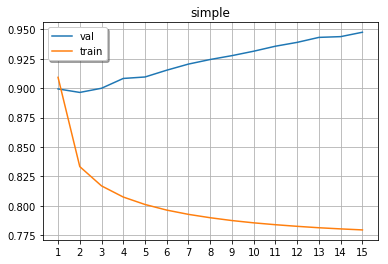

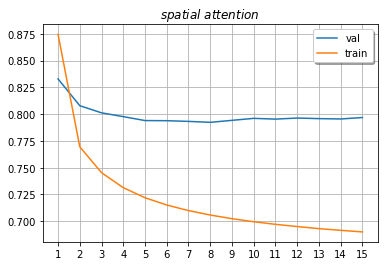

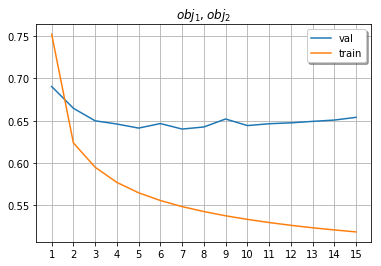

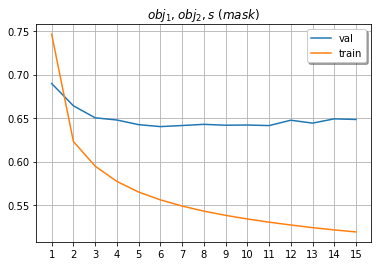

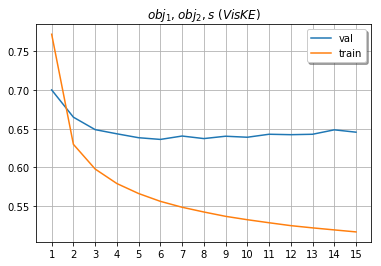

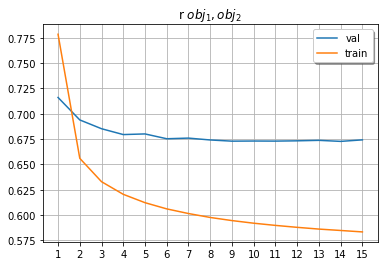

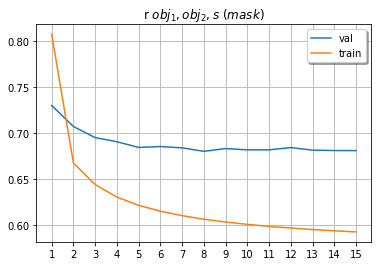

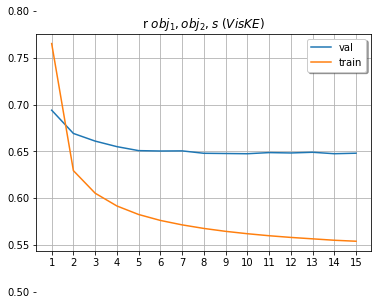

In [8]:
for i,mode in enumerate(mode2title):
    plt.title(mode2title[mode])
    plt.plot(range(1, epochs+1), history[mode]['val_loss'], label='val'.format(mode2title[mode]))
    plt.plot(range(1, epochs+1), history[mode]['loss'], label='train'.format(mode2title[mode]))
    #plt.bar([i+0.25], history[mode]['loss'][2:], width=0.5, label='{0} (train)'.format(mode2title[mode]))
    #plt.plot(range(2, epochs+1), history[mode]['val_loss'][1:], label='{0} (val)'.format(mode))
    #plt.plot(range(2, epochs+1), history[mode]['loss'][1:], label='{0} (train)'.format(mode))
    plt.legend(loc='best',
           fancybox=True, shadow=True)
    plt.xticks(np.arange(1, epochs+1))
    #plt.savefig('bargraph_mrs.pdf', bbox_inches='tight')
    plt.grid()
    plt.show()
    
#plt.legend(loc='upper right', bbox_to_anchor=(1.5, 1),
#           #ncol=len(history),
#           fancybox=True, shadow=True)
#plt.xticks(np.arange(1, epochs+1))
#plt.savefig('bargraph_mrs.pdf', bbox_inches='tight')
#plt.show()

### Evaluation

In [9]:
## load from files
base_url = 'https://cs.stanford.edu/people/rak248/'

images = {
    item['image_id']: {
        'width'  : item['width'],
        'height' : item['height'],
        'path'   : item['url'].replace(base_url, 'visual_genome/data/')
    }
    for item in json.load(open('visual_genome/data/image_data.json'))
}

# read from file
rels_from_file = json.load(open('visual_genome/data/relationships.json'))

# name/names correction for reading content of nodes in the dataset
def name_extract(x):
    if 'names' in x and len(x['names']):
        name = x['names'][0]
    elif 'name' in x:
        name = x['name']
    else:
        name = ''
    return name.strip().lower()

# convert it into a set of (image, subject, predicate, object)
triplets_key_values = {
    (
        rels_in_image['image_id'],
        name_extract(rel['subject']),
        rel['predicate'].lower().strip(),
        name_extract(rel['object']),
    ): (
        rels_in_image['image_id'],
        (name_extract(rel['subject']), rel['subject']['object_id'], (rel['subject']['x'],rel['subject']['y'],rel['subject']['w'],rel['subject']['h'])),
        rel['predicate'].lower().strip(),
        (name_extract(rel['object']), rel['object']['object_id'], (rel['object']['x'], rel['object']['y'], rel['object']['w'], rel['object']['h'])),
    )
    for rels_in_image in rels_from_file
    for rel in rels_in_image['relationships']
}
triplets = list(triplets_key_values.values())
del triplets_key_values

image_ids = list(np.load('visual_genome/data/relationships/image_ids.npy'))

test_image_ids = image_ids[-100:]

chunck_size = 10000
img_visual_features = []
for l in range(0, len(image_ids), chunck_size):
    vfs = np.load('visual_genome/data/relationships/image_resnet50_features_['+str(l)+'].npy')
    img_visual_features += [
        (iid, vf)
        for iid, vf in zip(image_ids[l:l+chunck_size], vfs)
        if iid in test_image_ids
        if type(vf) != int
    ]
    del vfs

img_visual_features = dict(img_visual_features)

# clean the data from examples in which there is no saved vector for them
triplets = [item for item in triplets if item[0] in img_visual_features and item[0]]

object_ids = list(np.load('visual_genome/data/relationships/object_ids.npy'))

chunck_size = 100000
visual_features = []
for l in range(0, len(object_ids), chunck_size):
    vfs = np.load('visual_genome/data/relationships/objects_resnet50_features_['+str(l)+'].npy')
    visual_features += list(zip(object_ids[l:l+chunck_size], vfs))

visual_features = dict(visual_features)

#vocab = Counter([w.strip() for _,(sbj,_,_),pred,(obj,_,_) in triplets for w in ' '.join([sbj,pred,obj]).split(' ')])
#np.save('visual_genome/data/relationships/vocab_caption.npy', vocab)
vocab = np.load('visual_genome/data/relationships/vocab_caption.npy')[None][0]

word2ix = {w:i for i,w in enumerate(['<0>', '<s>']+list(vocab))}
ix2word = {i:w for w,i in word2ix.items()}
word2onehot = lambda w: np.array([0.]*word2ix[w] + [1.] + [0.]*(len(word2ix)-word2ix[w]-1))

max_len = max(len(' '.join([sbj,pred,obj]).split(' ')) for _,(sbj,_,_),pred,(obj,_,_) in triplets)
max_len = 16

In [10]:
len(triplets)

773

In [11]:
triplets

[(2417894,
  ('c', 1058255, (335, 336, 16, 17)),
  'on',
  ('hat', 1058254, (301, 332, 92, 42))),
 (2417894,
  ('band', 1058257, (396, 181, 31, 28)),
  'around',
  ('wrist', 1058258, (393, 180, 22, 22))),
 (2417894,
  ('pictures', 1058259, (42, 77, 369, 62)),
  'on',
  ('shelf', 1058260, (67, 125, 331, 22))),
 (2417894,
  ('man', 1058261, (0, 110, 357, 264)),
  'on',
  ('couch', 1058262, (0, 271, 282, 102))),
 (2417894,
  ('pole', 1058268, (86, 58, 11, 93)),
  'for',
  ('floor lamp', 1058269, (70, 10, 55, 142))),
 (2417894,
  ('picture', 1058270, (297, 6, 69, 91)),
  'on',
  ('wall', 1058271, (41, 0, 458, 330))),
 (2417894,
  ('christmas tree', 1058265, (345, 0, 154, 353)),
  'in',
  ('living room', 1058272, (0, 0, 499, 374))),
 (2417894,
  ('man', 1058261, (0, 110, 357, 264)),
  'wearing a',
  ('shirt', 1058273, (1, 232, 255, 141))),
 (2417894,
  ('ornament', 1058274, (416, 110, 7, 53)),
  'on',
  ('christmas tree', 1058265, (345, 0, 154, 353))),
 (2417894,
  ('socket', 1058266, (338,

In [12]:
def item2features(item):
    img_id,(sbj,object_id1,sbj_bbx),pred,(obj,object_id2,obj_bbx) = item

    # visual features
    vf0 = img_visual_features[img_id]
    vf1 = visual_features[object_id1]
    vf2 = visual_features[object_id2]

    # spatial features
    # based on VisKE
    a1 = sbj_bbx[2] * sbj_bbx[3]
    a2 = obj_bbx[2] * obj_bbx[3]
    if obj_bbx[0] <= sbj_bbx[0] <= obj_bbx[0]+obj_bbx[2] <= sbj_bbx[0] + sbj_bbx[2]:
        # overlap
        w = (obj_bbx[0]+obj_bbx[2]) - (sbj_bbx[0])
    elif obj_bbx[0] <= sbj_bbx[0] <= sbj_bbx[0] + sbj_bbx[2] <= obj_bbx[0]+obj_bbx[2]:
        # obj contains sbj
        w = sbj_bbx[2]
    elif sbj_bbx[0] <= obj_bbx[0] <= sbj_bbx[0] + sbj_bbx[2] <= obj_bbx[0]+obj_bbx[2]:
        # overlaps
        w = (sbj_bbx[0]+sbj_bbx[2]) - (obj_bbx[0])
    elif sbj_bbx[0] <= obj_bbx[0] <= obj_bbx[0]+obj_bbx[2] <= sbj_bbx[0] + sbj_bbx[2]:
        # subj contains obj
        w = obj_bbx[2]
    else:
        w = 0

    if obj_bbx[1] <= sbj_bbx[1] <= obj_bbx[1]+obj_bbx[3] <= sbj_bbx[1] + sbj_bbx[3]:
        # overlap
        h = (obj_bbx[1]+obj_bbx[3]) - (sbj_bbx[1])
    elif obj_bbx[1] <= sbj_bbx[1] <= sbj_bbx[1] + sbj_bbx[3] <= obj_bbx[1]+obj_bbx[3]:
        # obj contains sbj
        h = sbj_bbx[3]
    elif sbj_bbx[1] <= obj_bbx[1] <= sbj_bbx[1] + sbj_bbx[3] <= obj_bbx[1]+obj_bbx[3]:
        # overlaps
        h = (sbj_bbx[1]+sbj_bbx[3]) - (obj_bbx[1])
    elif sbj_bbx[1] <= obj_bbx[1] <= obj_bbx[1]+obj_bbx[3] <= sbj_bbx[1] + sbj_bbx[3]:
        # subj contains obj
        h = obj_bbx[3]
    else:
        h = 0

    overlap_a = w * h

    # dx; dy; ov; ov1; ov2; h1;w1; h2;w2; a1; a2
    sf1 = [
        #obj_bbx[0] - sbj_bbx[0], # dx = x2 - x1 
        #obj_bbx[1] - sbj_bbx[1], # dy = y2 - y1
        obj_bbx[0] - sbj_bbx[0] + (obj_bbx[2] - sbj_bbx[2])/2, # dx = x2 - x1 + (w2 - w1)/2
        obj_bbx[1] - sbj_bbx[1] + (obj_bbx[3] - sbj_bbx[3])/2, # dy = y2 - y1 + (h2 - h1)/2
        0 if (a1+a2) == 0 else overlap_a/(a1+a2), # ov
        0 if a1 == 0 else overlap_a/a1, # ov1
        0 if a2 == 0 else overlap_a/a2, # ov2
        sbj_bbx[3], # h1
        sbj_bbx[2], # w1
        obj_bbx[3], # h2
        obj_bbx[2], # w2
        a1, # a1
        a2, # a2
    ]
    
    # spatial template (two attention masks)
    x1, y1, w1, h1 = sbj_bbx
    x2, y2, w2, h2 = obj_bbx

    mask = np.zeros([7,7,2])
    mask[int(y1*7):int((y1+h1)*7), int(x1*7):int((x1+w1)*7), 0] = 1 # mask bbox 1 
    mask[int(y2*7):int((y2+h2)*7), int(x2*7):int((x2+w2)*7), 0] = 1 # mask bbox 2

    sf2 = mask.flatten()
    
    # sentence encoding
    sent = ' '.join([sbj,pred,obj]).split(' ')
    sent = [word2ix['<s>']]+[word2ix[w] for w in sent]+[word2ix['<0>']]*(1+max_len-len(sent))

    return vf0, sf1, sf2, vf1, vf2, sent
    
def generator_features_description(batch_size=1, split=(0.,1.), all_data = triplets, mode='bbox'):
    while True:
        # shuffle 
        _all_data = all_data[:]
        #np.random.shuffle(_all_data)
        
        # start
        X_vfs = []
        X_sfs = []
        X_objs = []
        X_sents = []
        
        for item in _all_data:
            vf0, sf1, sf2, vf1, vf2, sent = item2features(item)
            
            X_vfs.append(vf0)
            X_sents.append(sent)
            
            if mode[:4] == 'bbox' or mode[-4:] == 'bbox':
                X_sfs.append(sf1)
            elif mode[:9] == 'attention':
                X_sfs.append(sf2)
            
            if mode[:4] == 'bbox' or mode[:9] == 'attention' or mode[:8] == 'implicit':
                l = [vf1, vf2]
                if mode[-2:] == '-r':
                    np.random.shuffle(l)
                X_objs.append(l)
            
            if len(X_sents) == batch_size:
                sents = np.array(X_sents)
                if mode[:4] == 'bbox' or mode[:9] == 'attention':
                    yield ([np.array(X_vfs), np.array(X_sfs), np.array(X_objs), sents[:, :-1]], np.expand_dims(sents[:, 1:], 2))
                    
                elif mode[:8] == 'implicit':
                    yield ([np.array(X_vfs), np.array(X_objs), sents[:, :-1]], np.expand_dims(sents[:, 1:], 2))
                    
                elif mode == 'spatial_adaptive-bbox':
                    yield ([np.array(X_vfs), np.array(X_sfs), sents[:, :-1]], np.expand_dims(sents[:, 1:], 2))

                elif mode[:7] == 'no-beta' or mode == 'spatial_adaptive' or mode == 'spatial_adaptive-attention':
                    yield ([np.array(X_vfs), sents[:, :-1]], np.expand_dims(sents[:, 1:], 2))
                    
                X_vfs = []
                X_sfs = []
                X_objs = []
                X_sents = []

In [13]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="3"
from keras.models import load_model, Model
from keras.preprocessing import image
#model = load_model('visual_genome/data/relationships/caption_model_bbox_1epochs.h5')

Using TensorFlow backend.


In [14]:
#model = load_model(dir_path + 'caption_model_{0}_{1}epochs.h5'.format(mode, epochs))
#model_beta = Model(model.input, model.layers[-2].input[-1])


In [62]:
#np.random.seed(314159)
dataset = triplets[:]
#np.random.shuffle(dataset)
dataset = [item for item in dataset if item[0] == 2417928]

In [61]:
for i, item in enumerate(dataset):
    iid = item[0]
    #print(' '.join([item[1][0],item[2],item[3][0]]).split(' '))
    if item[2] == 'above':
        print(item)
        print(item[1][0],item[2],item[3][0],)
        print(item[1][2],item[3][2],)

(2417914, ('sky', 4652762, (170, 28, 208, 30)), 'above', ('land', 4652763, (395, 130, 86, 189)))
sky above land
(170, 28, 208, 30) (395, 130, 86, 189)
(2417928, ('mirror', 3400439, (182, 29, 86, 103)), 'above', ('sink', 2792438, (215, 125, 55, 21)))
mirror above sink
(182, 29, 86, 103) (215, 125, 55, 21)
(2417928, ('lamps', 3258589, (226, 21, 14, 21)), 'above', ('mirror', 3400439, (182, 29, 86, 103)))
lamps above mirror
(226, 21, 14, 21) (182, 29, 86, 103)
(2417928, ('window', 3511418, (43, 42, 133, 105)), 'above', ('tub', 3511419, (20, 137, 204, 130)))
window above tub
(43, 42, 133, 105) (20, 137, 204, 130)


rack on back door


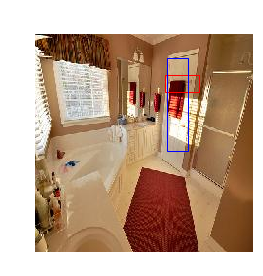

towel hanging from rack


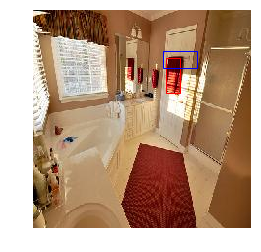

blinds on window


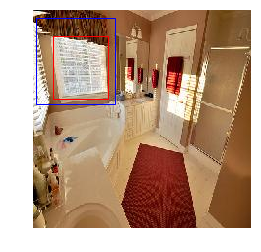

mirror above sink


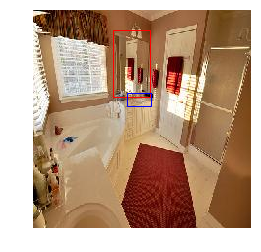

lamps above mirror


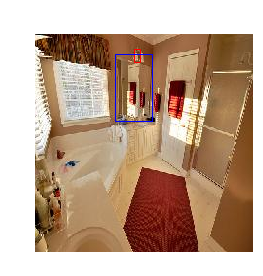

mirror on wall


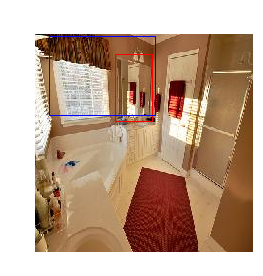

bathtub in room


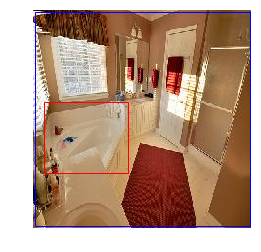

carpet on ground


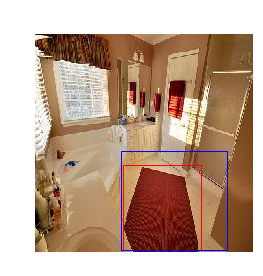

door in room


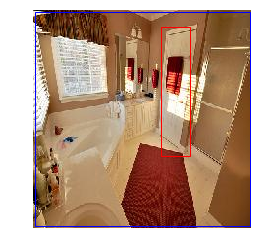

window above tub


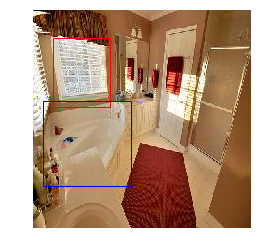

floor under rug


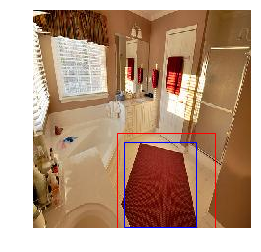

blinds on mirror


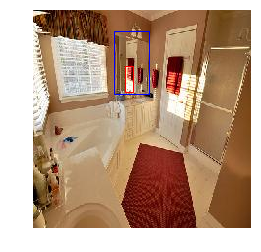

In [63]:
for i, item in enumerate(dataset):
    #iid = test_image_ids[i]
    iid = item[0]
    #if iid != 2417898:
    #    continue
        
    print(item[1][0],item[2],item[3][0],)
    img = image.load_img('visual_genome/data/relationships/images/{0}.jpg'.format(iid), target_size=(224, 224))
    ax = plt.axes()
    plt.imshow(img)
    rect1 = patches.Rectangle(
        (item[1][2][0]/images[iid]['width']*224,item[1][2][1]/images[iid]['height']*224),
        item[1][2][2]/images[iid]['width']*224,item[1][2][3]/images[iid]['height']*224,
        linewidth=1,edgecolor='r',facecolor='none')
    rect2 = patches.Rectangle(
        (item[3][2][0]/images[iid]['width']*224,item[3][2][1]/images[iid]['height']*224),
        item[3][2][2]/images[iid]['width']*224,item[3][2][3]/images[iid]['height']*224,
        linewidth=1,edgecolor='b',facecolor='none')

    ax.add_patch(rect1)
    ax.add_patch(rect2)
    plt.axis('off')
    plt.show()

implicit
0.935 0.059 0.006 rack
0.955 0.016 0.029 on
0.940 0.005 0.055 back
0.946 0.005 0.049 door
0.956 0.005 0.039 <0>



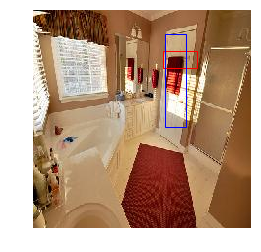

0.943 0.046 0.011 towel
0.964 0.015 0.021 hanging
0.961 0.009 0.030 from
0.948 0.005 0.047 rack
0.962 0.005 0.033 <0>



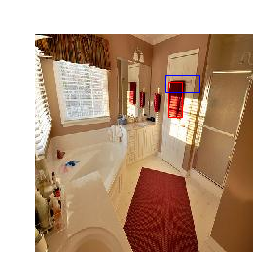

0.925 0.069 0.006 blinds
0.963 0.014 0.023 on
0.940 0.006 0.054 window
0.960 0.005 0.035 <0>



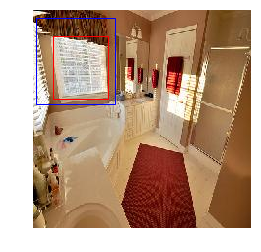

0.909 0.090 0.001 mirror
0.970 0.007 0.023 above
0.935 0.001 0.064 sink
0.967 0.001 0.033 <0>



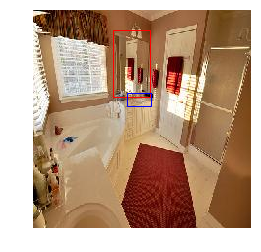

0.927 0.066 0.006 lamps
0.951 0.017 0.032 above
0.923 0.001 0.076 mirror
0.951 0.001 0.048 <0>



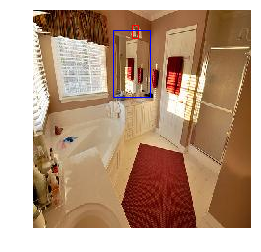

0.924 0.076 0.001 mirror
0.955 0.016 0.029 on
0.944 0.010 0.046 wall
0.955 0.010 0.036 <0>



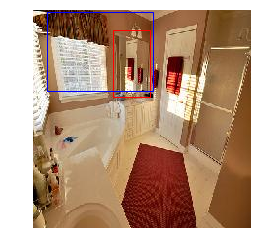

0.927 0.073 0.001 bathtub
0.960 0.009 0.031 in
0.951 0.001 0.048 room
0.962 0.004 0.034 <0>



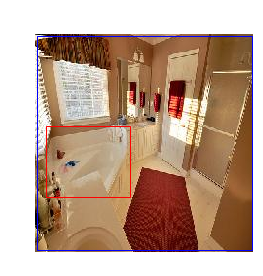

0.942 0.058 0.001 carpet
0.963 0.008 0.029 on
0.947 0.017 0.036 ground
0.959 0.009 0.032 <0>



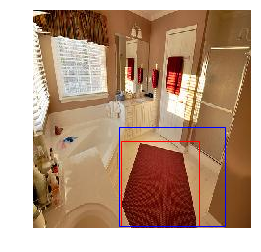

0.932 0.067 0.000 door
0.971 0.007 0.022 in
0.949 0.005 0.046 room
0.963 0.001 0.036 <0>



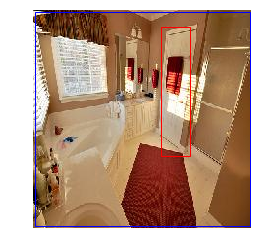

0.924 0.070 0.006 window
0.961 0.016 0.023 above
0.940 0.001 0.059 tub
0.960 0.009 0.030 <0>



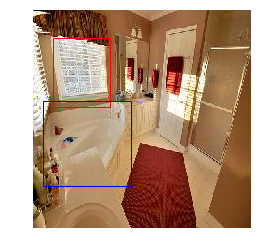

0.921 0.073 0.006 floor
0.956 0.016 0.028 under
0.934 0.005 0.061 rug
0.960 0.009 0.031 <0>



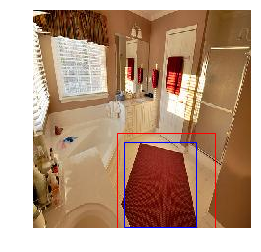

0.925 0.063 0.011 blinds
0.961 0.016 0.023 on
0.936 0.005 0.059 mirror
0.951 0.001 0.048 <0>



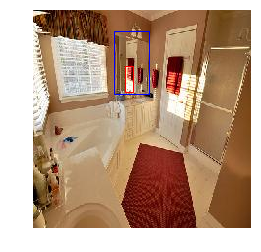

bbox
0.890 0.051 0.059 0.001 rack
0.893 0.070 0.018 0.019 on
0.937 0.004 0.012 0.048 back
0.932 0.013 0.006 0.049 door
0.946 0.002 0.005 0.047 <0>



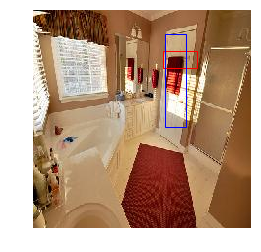

0.874 0.068 0.046 0.011 towel
0.904 0.067 0.017 0.012 hanging
0.920 0.048 0.008 0.024 from
0.946 0.005 0.005 0.044 rack
0.946 0.020 0.004 0.030 <0>



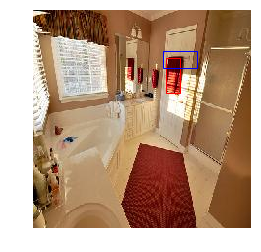

0.899 0.034 0.067 0.001 blinds
0.900 0.067 0.017 0.016 on
0.943 0.004 0.011 0.042 window
0.961 0.004 0.005 0.029 <0>



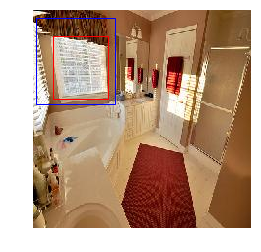

0.888 0.032 0.074 0.006 mirror
0.941 0.021 0.013 0.025 above
0.926 0.009 0.001 0.064 sink
0.953 0.006 0.003 0.038 <0>



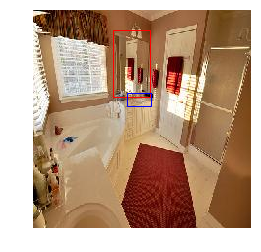

0.896 0.039 0.065 0.001 lamps
0.907 0.059 0.018 0.016 above
0.914 0.001 0.005 0.080 mirror
0.946 0.003 0.007 0.045 <0>



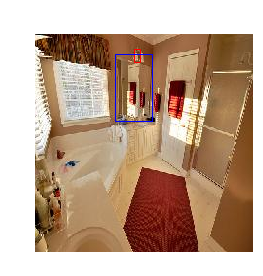

0.891 0.043 0.065 0.001 mirror
0.894 0.074 0.017 0.015 on
0.940 0.002 0.013 0.045 wall
0.966 0.002 0.003 0.029 <0>



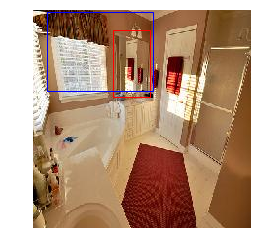

0.912 0.019 0.068 0.001 bathtub
0.874 0.096 0.014 0.016 in
0.952 0.007 0.005 0.036 room
0.984 0.001 0.004 0.011 <0>



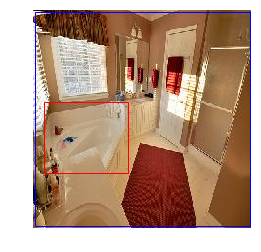

0.873 0.070 0.056 0.001 carpet
0.895 0.070 0.018 0.018 on
0.944 0.010 0.010 0.036 ground
0.972 0.008 0.004 0.016 <0>



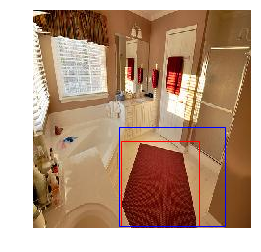

0.899 0.039 0.061 0.001 door
0.874 0.096 0.014 0.016 in
0.946 0.002 0.010 0.042 room
0.984 0.001 0.004 0.011 <0>



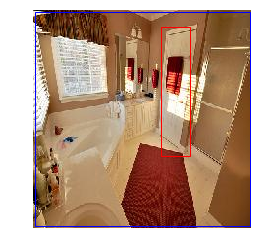

0.892 0.035 0.073 0.001 window
0.901 0.070 0.016 0.013 above
0.938 0.005 0.004 0.053 tub
0.976 0.002 0.005 0.018 <0>



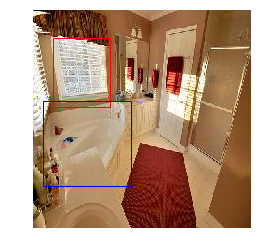

0.856 0.079 0.064 0.001 floor
0.904 0.067 0.017 0.012 under
0.951 0.005 0.002 0.042 rug
0.958 0.013 0.005 0.024 <0>



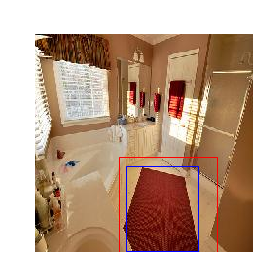

0.898 0.030 0.060 0.011 blinds
0.903 0.066 0.015 0.017 on
0.943 0.005 0.005 0.048 mirror
0.936 0.017 0.005 0.042 <0>



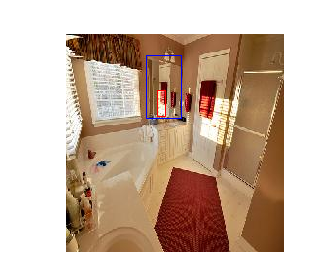

attention
0.932 0.000 0.058 0.010 rack
0.948 0.000 0.023 0.029 on
0.938 0.000 0.009 0.053 back
0.940 0.000 0.008 0.052 door
0.948 0.000 0.011 0.040 <0>



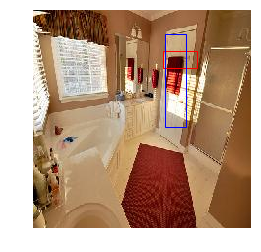

0.943 0.000 0.045 0.013 towel
0.961 0.000 0.019 0.020 hanging
0.963 0.000 0.006 0.031 from
0.943 0.000 0.005 0.053 rack
0.960 0.000 0.005 0.034 <0>



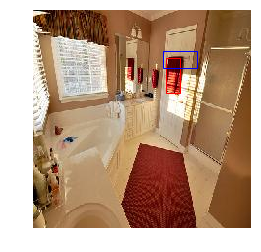

0.939 0.000 0.060 0.001 blinds
0.964 0.000 0.016 0.020 on
0.953 0.000 0.007 0.040 window
0.962 0.000 0.005 0.033 <0>



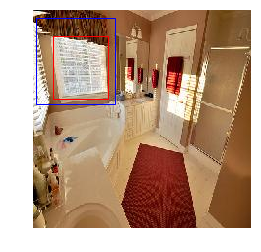

0.913 0.000 0.082 0.006 mirror
0.968 0.000 0.006 0.026 above
0.921 0.000 0.001 0.078 sink
0.956 0.000 0.001 0.043 <0>



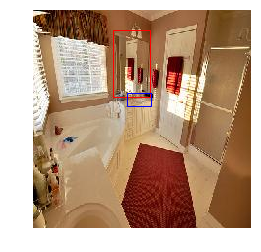

0.926 0.000 0.066 0.008 lamps
0.940 0.000 0.024 0.036 above
0.920 0.000 0.001 0.078 mirror
0.943 0.000 0.005 0.052 <0>



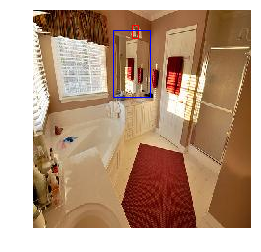

0.929 0.000 0.071 0.000 mirror
0.956 0.000 0.022 0.022 on
0.938 0.000 0.006 0.056 wall
0.955 0.000 0.006 0.038 <0>



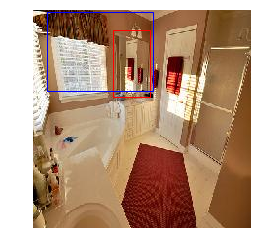

0.936 0.000 0.064 0.001 bathtub
0.955 0.000 0.006 0.038 in
0.948 0.000 0.004 0.048 room
0.956 0.000 0.006 0.038 <0>



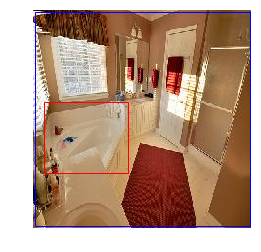

0.939 0.000 0.061 0.000 carpet
0.955 0.000 0.006 0.038 on
0.954 0.000 0.007 0.039 ground
0.958 0.000 0.001 0.042 <0>



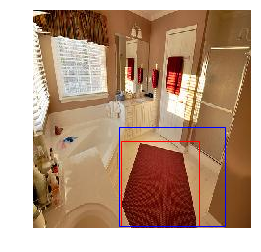

0.937 0.000 0.063 0.000 door
0.964 0.000 0.015 0.020 in
0.952 0.000 0.004 0.044 room
0.964 0.000 0.005 0.031 <0>



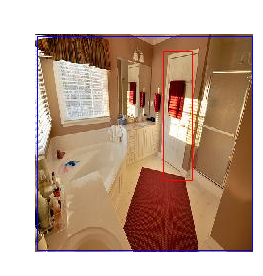

0.933 0.000 0.066 0.000 window
0.959 0.000 0.021 0.020 above
0.940 0.000 0.005 0.055 tub
0.952 0.000 0.007 0.041 <0>



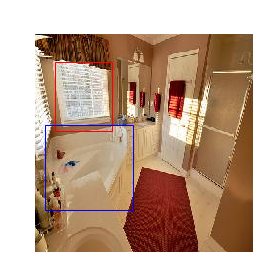

0.934 0.000 0.066 0.000 floor
0.964 0.000 0.005 0.031 under
0.931 0.000 0.001 0.068 rug
0.958 0.000 0.005 0.037 <0>



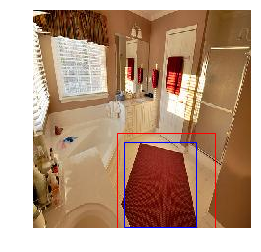

0.921 0.000 0.069 0.010 blinds
0.948 0.000 0.022 0.030 on
0.936 0.000 0.006 0.058 mirror
0.942 0.000 0.008 0.050 <0>



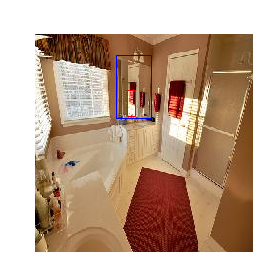

spatial_adaptive-bbox
0.826 0.072 0.000 0.001 0.001 rack
0.826 0.072 0.000 0.001 0.001 on
0.826 0.072 0.000 0.001 0.001 back
0.826 0.072 0.000 0.001 0.001 door
0.826 0.072 0.000 0.001 0.001 <0>



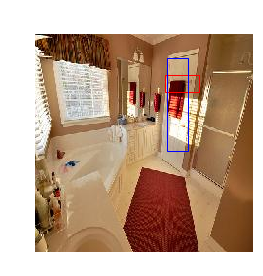

0.826 0.072 0.000 0.001 0.001 towel
0.826 0.072 0.000 0.001 0.001 hanging
0.826 0.072 0.000 0.001 0.001 from
0.826 0.072 0.000 0.001 0.001 rack
0.826 0.072 0.000 0.001 0.001 <0>



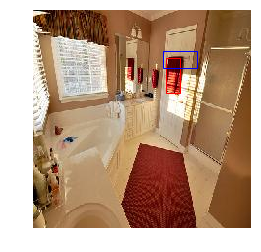

0.826 0.072 0.000 0.001 0.001 blinds
0.826 0.072 0.000 0.001 0.001 on
0.826 0.072 0.000 0.001 0.001 window
0.826 0.072 0.000 0.001 0.001 <0>



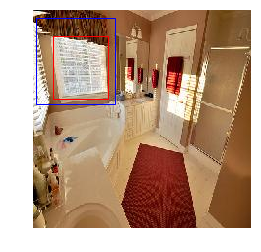

0.826 0.072 0.000 0.001 0.001 mirror
0.826 0.072 0.000 0.001 0.001 above
0.826 0.072 0.000 0.001 0.001 sink
0.826 0.072 0.000 0.001 0.001 <0>



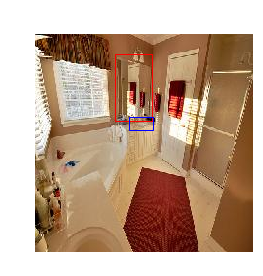

0.826 0.072 0.000 0.001 0.001 lamps
0.826 0.072 0.000 0.001 0.001 above
0.826 0.072 0.000 0.001 0.001 mirror
0.826 0.072 0.000 0.001 0.001 <0>



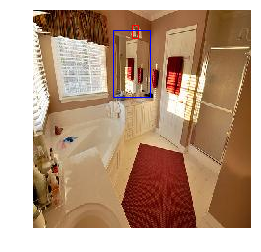

0.826 0.072 0.000 0.001 0.001 mirror
0.826 0.072 0.000 0.001 0.001 on
0.826 0.072 0.000 0.001 0.001 wall
0.826 0.072 0.000 0.001 0.001 <0>



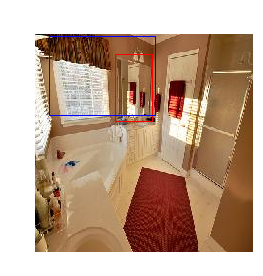

0.826 0.072 0.000 0.001 0.001 bathtub
0.826 0.072 0.000 0.001 0.001 in
0.826 0.072 0.000 0.001 0.001 room
0.826 0.072 0.000 0.001 0.001 <0>



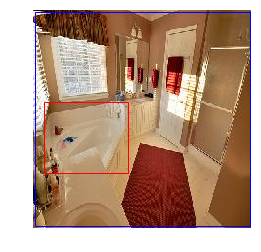

0.826 0.072 0.000 0.001 0.001 carpet
0.826 0.072 0.000 0.001 0.001 on
0.826 0.072 0.000 0.001 0.001 ground
0.826 0.072 0.000 0.001 0.001 <0>



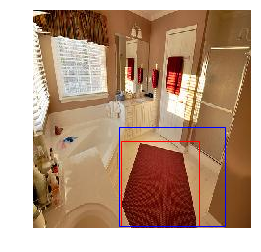

0.826 0.072 0.000 0.001 0.001 door
0.826 0.072 0.000 0.001 0.001 in
0.826 0.072 0.000 0.001 0.001 room
0.826 0.072 0.000 0.001 0.001 <0>



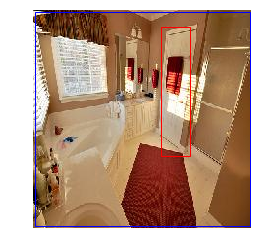

0.826 0.072 0.000 0.001 0.001 window
0.826 0.072 0.000 0.001 0.001 above
0.826 0.072 0.000 0.001 0.001 tub
0.826 0.072 0.000 0.001 0.001 <0>



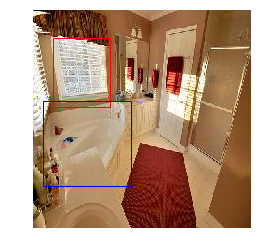

0.826 0.072 0.000 0.001 0.001 floor
0.826 0.072 0.000 0.001 0.001 under
0.826 0.072 0.000 0.001 0.001 rug
0.826 0.072 0.000 0.001 0.001 <0>



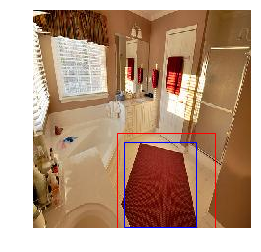

0.826 0.072 0.000 0.001 0.001 blinds
0.826 0.072 0.000 0.001 0.001 on
0.826 0.072 0.000 0.001 0.001 mirror
0.826 0.072 0.000 0.001 0.001 <0>



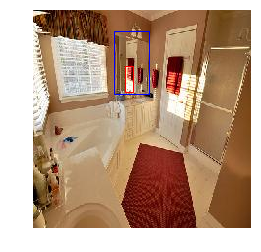

implicit-r
0.929 0.054 0.017 rack
0.950 0.017 0.033 on
0.922 0.023 0.055 back
0.928 0.023 0.049 door
0.951 0.013 0.036 <0>



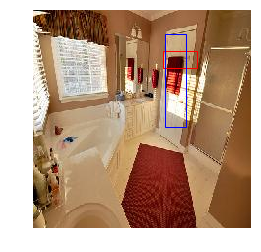

0.937 0.035 0.028 towel
0.963 0.019 0.019 hanging
0.951 0.021 0.028 from
0.926 0.030 0.043 rack
0.950 0.009 0.041 <0>



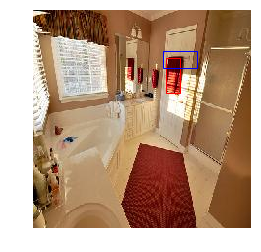

0.919 0.049 0.031 blinds
0.962 0.023 0.014 on
0.912 0.027 0.061 window
0.951 0.010 0.039 <0>



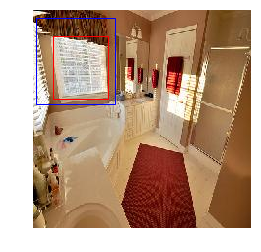

0.909 0.069 0.021 mirror
0.940 0.018 0.042 above
0.902 0.046 0.052 sink
0.926 0.015 0.060 <0>



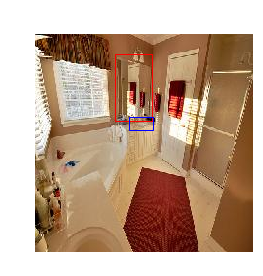

0.919 0.061 0.020 lamps
0.942 0.026 0.033 above
0.900 0.029 0.071 mirror
0.941 0.020 0.039 <0>



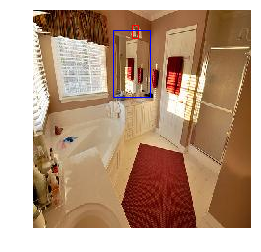

0.901 0.014 0.084 mirror
0.948 0.030 0.022 on
0.912 0.067 0.021 wall
0.946 0.035 0.019 <0>



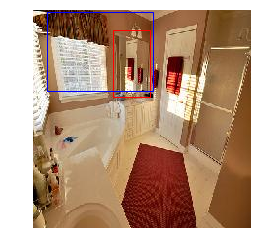

0.915 0.066 0.018 bathtub
0.942 0.031 0.026 in
0.920 0.022 0.057 room
0.942 0.019 0.040 <0>



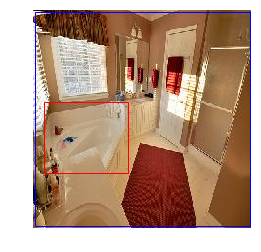

0.929 0.021 0.050 carpet
0.954 0.021 0.025 on
0.934 0.042 0.024 ground
0.954 0.028 0.018 <0>



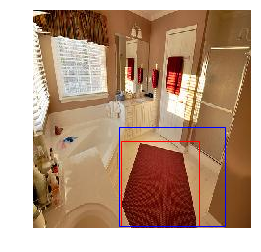

0.903 0.078 0.019 door
0.951 0.032 0.017 in
0.907 0.018 0.074 room
0.937 0.014 0.049 <0>



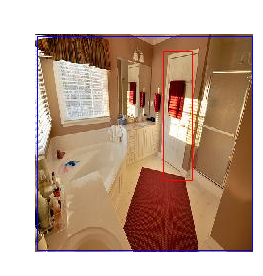

0.913 0.069 0.019 window
0.951 0.018 0.031 above
0.910 0.020 0.070 tub
0.943 0.012 0.045 <0>



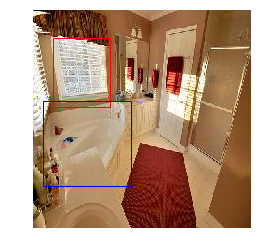

0.918 0.064 0.018 floor
0.950 0.038 0.011 under
0.911 0.042 0.047 rug
0.941 0.020 0.039 <0>



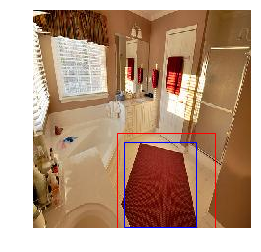

0.911 0.026 0.062 blinds
0.954 0.019 0.026 on
0.910 0.073 0.017 mirror
0.938 0.049 0.013 <0>



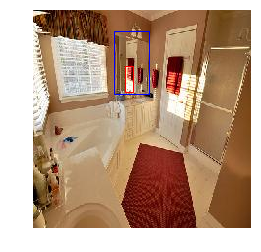

bbox-r
0.928 0.000 0.002 0.070 rack
0.932 0.000 0.045 0.023 on
0.916 0.000 0.072 0.012 back
0.925 0.000 0.064 0.011 door
0.933 0.000 0.057 0.010 <0>



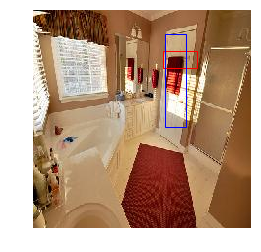

0.932 0.000 0.021 0.047 towel
0.951 0.000 0.027 0.023 hanging
0.945 0.000 0.031 0.025 from
0.925 0.000 0.049 0.026 rack
0.941 0.000 0.029 0.030 <0>



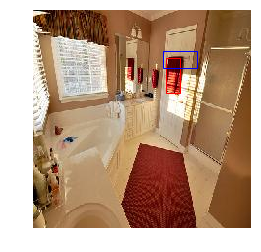

0.921 0.000 0.067 0.012 blinds
0.943 0.000 0.027 0.031 on
0.921 0.000 0.011 0.068 window
0.941 0.000 0.010 0.049 <0>



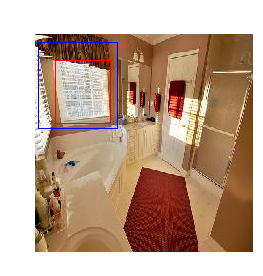

0.890 0.000 0.013 0.096 mirror
0.963 0.000 0.027 0.010 above
0.912 0.000 0.075 0.013 sink
0.935 0.000 0.056 0.009 <0>



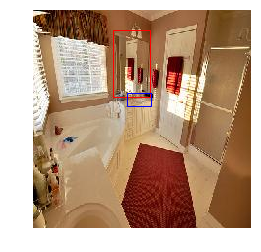

0.927 0.000 0.002 0.071 lamps
0.931 0.000 0.045 0.023 above
0.903 0.000 0.085 0.012 mirror
0.933 0.000 0.057 0.010 <0>



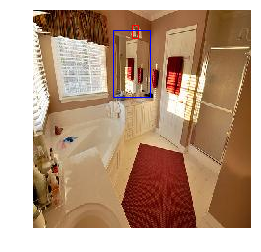

0.919 0.000 0.078 0.003 mirror
0.932 0.000 0.031 0.037 on
0.916 0.000 0.012 0.072 wall
0.943 0.000 0.012 0.045 <0>



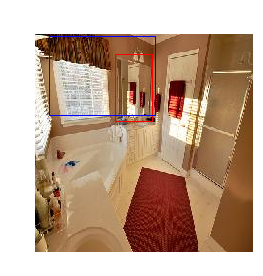

0.925 0.000 0.001 0.074 bathtub
0.929 0.000 0.043 0.028 in
0.920 0.000 0.067 0.013 room
0.933 0.000 0.042 0.025 <0>



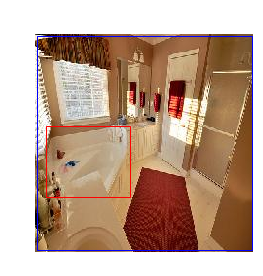

0.934 0.000 0.001 0.064 carpet
0.948 0.000 0.028 0.025 on
0.929 0.000 0.058 0.013 ground
0.933 0.000 0.046 0.021 <0>



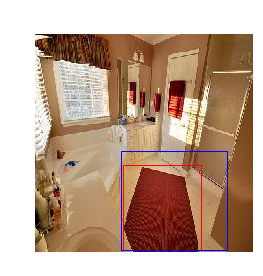

0.927 0.000 0.001 0.072 door
0.939 0.000 0.030 0.031 in
0.920 0.000 0.056 0.024 room
0.933 0.000 0.042 0.025 <0>



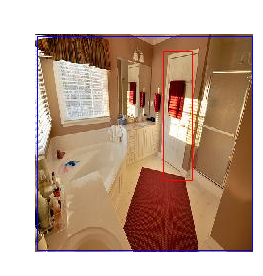

0.919 0.000 0.078 0.003 window
0.943 0.000 0.027 0.031 above
0.916 0.000 0.012 0.072 tub
0.936 0.000 0.011 0.053 <0>



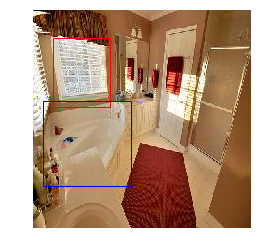

0.925 0.000 0.016 0.059 floor
0.971 0.000 0.020 0.009 under
0.928 0.000 0.045 0.027 rug
0.951 0.000 0.028 0.020 <0>



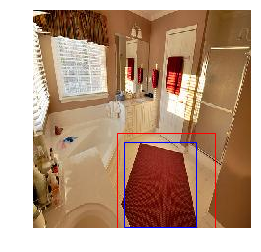

0.919 0.000 0.068 0.012 blinds
0.931 0.000 0.029 0.040 on
0.908 0.000 0.012 0.080 mirror
0.927 0.000 0.010 0.063 <0>



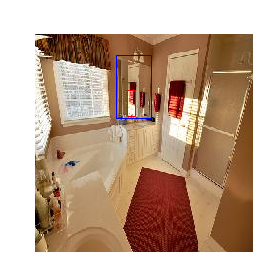

attention-r
0.919 0.000 0.056 0.025 rack
0.946 0.000 0.016 0.037 on
0.909 0.000 0.016 0.075 back
0.922 0.000 0.014 0.064 door
0.938 0.000 0.013 0.049 <0>



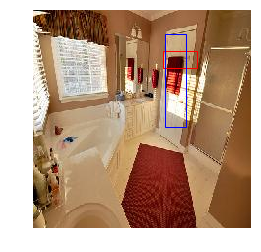

0.934 0.000 0.029 0.037 towel
0.955 0.000 0.022 0.023 hanging
0.955 0.000 0.022 0.023 from
0.933 0.000 0.045 0.023 rack
0.948 0.000 0.030 0.022 <0>



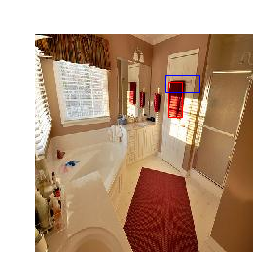

0.911 0.000 0.024 0.065 blinds
0.952 0.000 0.021 0.026 on
0.908 0.000 0.072 0.021 window
0.939 0.000 0.043 0.017 <0>



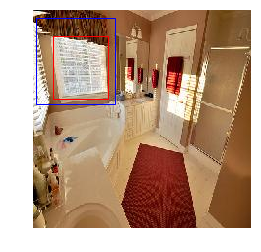

0.911 0.000 0.034 0.055 mirror
0.940 0.000 0.030 0.030 above
0.907 0.000 0.064 0.029 sink
0.945 0.000 0.026 0.029 <0>



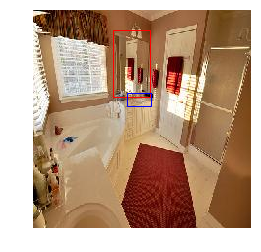

0.899 0.000 0.019 0.082 lamps
0.946 0.000 0.024 0.029 above
0.891 0.000 0.073 0.036 mirror
0.926 0.000 0.058 0.017 <0>



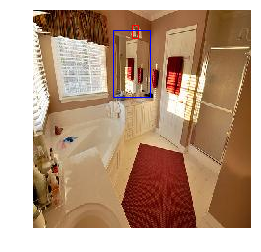

0.915 0.000 0.065 0.019 mirror
0.946 0.000 0.024 0.030 on
0.914 0.000 0.021 0.065 wall
0.930 0.000 0.014 0.056 <0>



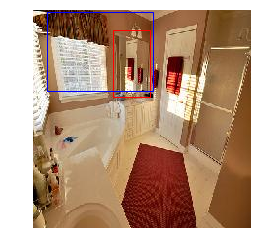

0.904 0.000 0.013 0.082 bathtub
0.958 0.000 0.032 0.010 in
0.911 0.000 0.077 0.012 room
0.948 0.000 0.039 0.013 <0>



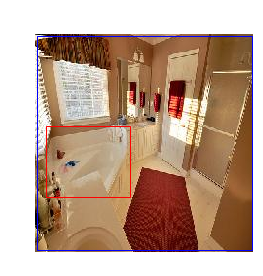

0.924 0.000 0.062 0.014 carpet
0.953 0.000 0.026 0.021 on
0.920 0.000 0.019 0.061 ground
0.940 0.000 0.014 0.046 <0>



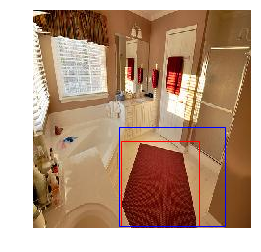

0.909 0.000 0.053 0.038 door
0.961 0.000 0.021 0.018 in
0.919 0.000 0.037 0.044 room
0.942 0.000 0.033 0.026 <0>



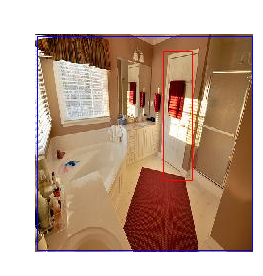

0.902 0.000 0.012 0.085 window
0.946 0.000 0.024 0.029 above
0.906 0.000 0.070 0.024 tub
0.943 0.000 0.038 0.020 <0>



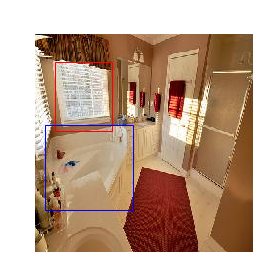

0.904 0.000 0.013 0.082 floor
0.948 0.000 0.019 0.033 under
0.905 0.000 0.040 0.055 rug
0.945 0.000 0.021 0.034 <0>



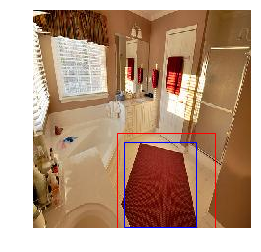

0.904 0.000 0.058 0.039 blinds
0.955 0.000 0.023 0.022 on
0.893 0.000 0.020 0.086 mirror
0.918 0.000 0.014 0.068 <0>



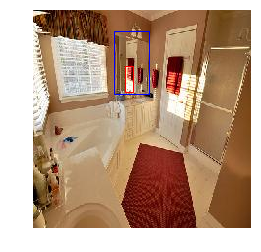

spatial_adaptivespatial_adaptive-attention


In [64]:
modes = [
    'implicit',
    'bbox',
    'attention',
    'spatial_adaptive-bbox',
    'no-beta',
    'implicit-r',
    'bbox-r',
    'attention-r',
    'spatial_adaptive'
    'spatial_adaptive-attention',
]
batch_size=1
for mode in modes:
    if mode == 'no-beta':
        continue
    print(mode)
    if Path(dir_path + 'caption_model_{0}_{1}epochs.h5'.format(mode, epochs)).is_file() and Path(dir_path + 'caption_model_{0}_{1}epochs_history.npy'.format(mode, epochs)).is_file():
        # if file exists load it to resume:
        model = load_model(dir_path + 'caption_model_{0}_{1}epochs.h5'.format(mode, epochs))
        model_beta = Model(model.input, model.layers[-2].input[-1])
        
        X, Y = None, None
        for xy in generator_features_description(batch_size=len(dataset), mode=mode, all_data=dataset):
            X, Y = xy
            break
            
        preds = model_beta.predict(X)
        for j, pred in enumerate(preds):
            sent_predict = Y[j].flatten()
            for i,b in enumerate(pred):
                print(' '.join(['{'+str(k)+':.3f}' for k in range(len(b)) if k < 5]).format(*b), ix2word[sent_predict[i]])
                if ix2word[sent_predict[i]] == '<0>':
                    print()
                    break

            item = dataset[j]
            #iid = test_image_ids[j]
            iid = item[0]
            img = image.load_img('visual_genome/data/relationships/images/{0}.jpg'.format(iid), target_size=(224, 224))
            ax = plt.axes()
            plt.imshow(img)
            rect1 = patches.Rectangle(
                (item[1][2][0]/images[iid]['width']*224,item[1][2][1]/images[iid]['height']*224),
                item[1][2][2]/images[iid]['width']*224,item[1][2][3]/images[iid]['height']*224,
                linewidth=1,edgecolor='r',facecolor='none')
            rect2 = patches.Rectangle(
                (item[3][2][0]/images[iid]['width']*224,item[3][2][1]/images[iid]['height']*224),
                item[3][2][2]/images[iid]['width']*224,item[3][2][3]/images[iid]['height']*224,
                linewidth=1,edgecolor='b',facecolor='none')

            ax.add_patch(rect1)
            ax.add_patch(rect2)
            plt.axis('off')
            plt.show()
